<a href="https://colab.research.google.com/github/wingated/cs474_labs_f2019/blob/master/DL_Lab4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Deep Convolution U-Net from this paper: [(U-Net: Convolutional Networks for Biomedical Image Segmentation)](https://arxiv.org/pdf/1505.04597.pdf)

Dataset from this link: [Cancer Dataset](http://liftothers.org/cancer_data.tar.gz)

Use a smaller batch size if you do not have 40gb of VRAM.

![(Figure 1)](https://lh3.googleusercontent.com/qnHiB3B2KRxC3NjiSDtY08_DgDGTDsHcO6PP53oNRuct-p2QXCR-gyLkDveO850F2tTAhIOPC5Ha06NP9xq1JPsVAHlQ5UXA5V-9zkUrJHGhP_MNHFoRGnjBz1vn1p8P2rMWhlAb6HQ=w2400)


In [1]:
!pip3 install torch
!pip3 install torchvision
!pip3 install tqdm

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import time
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms, utils, datasets
from tqdm import tqdm
from torch.nn.parameter import Parameter
import pdb
import torchvision
import os
import gzip
import tarfile
import gc
from IPython.core.ultratb import AutoFormattedTB
__ITB__ = AutoFormattedTB(mode = 'Verbose',color_scheme='LightBg', tb_offset = 1)

assert torch.cuda.is_available(), "You need to request a GPU from Runtime > Change Runtime"

In [2]:
class CancerDataset(Dataset):
  def __init__(self, root, download=True, size=512, train=True):
    if download and not os.path.exists(os.path.join(root, 'cancer_data')):
      datasets.utils.download_url('http://liftothers.org/cancer_data.tar.gz', root, 'cancer_data.tar.gz', None)
      self.extract_gzip(os.path.join(root, 'cancer_data.tar.gz'))
      self.extract_tar(os.path.join(root, 'cancer_data.tar'))

    postfix = 'train' if train else 'test'
    root = os.path.join(root, 'cancer_data', 'cancer_data')
    self.dataset_folder = torchvision.datasets.ImageFolder(os.path.join(root, 'inputs_' + postfix) ,transform = transforms.Compose([transforms.Resize(size),transforms.ToTensor()]))
    self.label_folder = torchvision.datasets.ImageFolder(os.path.join(root, 'outputs_' + postfix) ,transform = transforms.Compose([transforms.Resize(size),transforms.ToTensor()]))

  @staticmethod
  def extract_gzip(gzip_path, remove_finished=False):
    print('Extracting {}'.format(gzip_path))
    with open(gzip_path.replace('.gz', ''), 'wb') as out_f, gzip.GzipFile(gzip_path) as zip_f:
      out_f.write(zip_f.read())
    if remove_finished:
      os.unlink(gzip_path)

  @staticmethod
  def extract_tar(tar_path):
    print('Untarring {}'.format(tar_path))
    z = tarfile.TarFile(tar_path)
    z.extractall(tar_path.replace('.tar', ''))

  def __getitem__(self,index):
    img = self.dataset_folder[index]
    label = self.label_folder[index]
    return img[0],label[0][0]

  def __len__(self):
    return len(self.dataset_folder)

In [3]:
class Dimension():
  def __init__(self, input, output):
    self.input = input
    self.output = output

In [4]:
# Convolution block I can pass dimensions into
class ConvolutionBlock(nn.Module):
  def __init__(self, dimensions, dropout_rate=0.5):
    super(ConvolutionBlock, self).__init__()
    conv1, conv2 = dimensions
    self.block = nn.Sequential(
      nn.Conv2d(conv1.input, conv1.output, kernel_size = 3, padding = 1),
      nn.BatchNorm2d(conv1.output),
      nn.ReLU(),
      nn.Dropout(dropout_rate),
      nn.Conv2d(conv2.input, conv2.output, kernel_size = 3, padding = 1),
      nn.BatchNorm2d(conv2.output),
      nn.ReLU(),
      nn.Dropout(dropout_rate)
    )

  def forward(self, input):
    return self.block(input)

In [5]:
# Create all proper dimensions
all_dimensions = [
    [
        Dimension(3, 64),
        Dimension(64, 64)
    ],
    [
        Dimension(64, 128),
        Dimension(128, 128)
    ],
    [
        Dimension(128, 256),
        Dimension(256, 256)
    ],
    [
        Dimension(256, 512),
        Dimension(512, 512)
    ],
    [
        Dimension(512, 1024),
        Dimension(1024, 1024)
    ],
    [
        Dimension(1024, 512),
        Dimension(512, 512)
    ],
    [
        Dimension(512, 256),
        Dimension(256, 256)
    ],
    [
        Dimension(256, 128),
        Dimension(128, 128)
    ],
    [
        Dimension(128, 64),
        Dimension(64, 64)
    ]
]

In [6]:
class CancerDetection(nn.Module):
  def __init__(self, train_dataset, all_dimensions):
    super(CancerDetection, self).__init__()
    x, y = train_dataset[0]
    c, h, w = x.size()
    all_dimensions[0][0].input = c

    self.block1 = ConvolutionBlock(all_dimensions[0])
    self.block2 = ConvolutionBlock(all_dimensions[1])
    self.block3 = ConvolutionBlock(all_dimensions[2])
    self.block4 = ConvolutionBlock(all_dimensions[3])
    self.block5 = ConvolutionBlock(all_dimensions[4])
    self.pre_block_6_upconv = nn.ConvTranspose2d(all_dimensions[4][1].output, int(all_dimensions[5][0].input/2), kernel_size=2, stride=2)
    self.block6 = ConvolutionBlock(all_dimensions[5])
    self.pre_block_7_upconv = nn.ConvTranspose2d(all_dimensions[5][1].output, int(all_dimensions[6][0].input/2), kernel_size=2, stride=2)
    self.block7 = ConvolutionBlock(all_dimensions[6])
    self.pre_block_8_upconv = nn.ConvTranspose2d(all_dimensions[6][1].output, int(all_dimensions[7][0].input/2), kernel_size=2, stride=2)
    self.block8 = ConvolutionBlock(all_dimensions[7])
    self.pre_block_9_upconv = nn.ConvTranspose2d(all_dimensions[7][1].output, int(all_dimensions[8][0].input/2), kernel_size=2, stride=2)
    self.block9 = ConvolutionBlock(all_dimensions[8])
    self.out_conv = nn.Conv2d(all_dimensions[8][1].output, 2, kernel_size = 1, padding = 0)

    self.pool = nn.MaxPool2d(2, 2)

  def forward(self, input):
    a = self.block1(input)
    b = self.block2(self.pool(a))
    c = self.block3(self.pool(b))
    d = self.block4(self.pool(c))
    e = self.block5(self.pool(d))
    e = self.pre_block_6_upconv(e)
    f = self.block6(torch.cat((d, e), 1))
    f = self.pre_block_7_upconv(f)
    g = self.block7(torch.cat((c, f), 1))
    g = self.pre_block_8_upconv(g)
    h = self.block8(torch.cat((b, g), 1))
    h = self.pre_block_9_upconv(h)
    i = self.block9(torch.cat((a, h), 1))
    j = self.out_conv(i)
    h = j.squeeze(1)

    return h

  def num_params(self):
    sum = 0
    for p in self.parameters():
      sum += np.prod(p.size())
    return sum


In [7]:
# Initialize datasets
file_path = 'datasets'
train_dataset = CancerDataset(file_path, train=True)
val_dataset = CancerDataset(file_path, train=False)

# Initialize dataloaders
num_workers = os.cpu_count()
train_loader = DataLoader(train_dataset,
                          batch_size=6,
                          pin_memory=True,
                          shuffle=True,
                          num_workers=num_workers)
val_loader = DataLoader(val_dataset,
                        batch_size=6,
                        pin_memory=True,
                        num_workers=num_workers)

# Initialize Model
model = CancerDetection(train_dataset, all_dimensions)
model = model.cuda()

objective = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

100%|██████████| 2750494655/2750494655 [02:01<00:00, 22590154.00it/s]


Extracting datasets/cancer_data.tar.gz
Untarring datasets/cancer_data.tar


In [8]:
def show_prediction():
    input_image_path = 'datasets/cancer_data/cancer_data/inputs_test/0/pos_test_000072.png'
    output_image_path = 'datasets/cancer_data/cancer_data/outputs_test/0/pos_test_000072.png'

    original_image = mpimg.imread(input_image_path)

    correct_image = mpimg.imread(output_image_path)

    image = Image.open(input_image_path)
    transform = transforms.Compose([transforms.ToTensor()])
    image_tensor = transform(image)
    image_tensor = image_tensor.unsqueeze(0).to('cuda')

    model_output = model(image_tensor)
    single_channel_output = torch.argmax(model_output, dim=1).float()
    generated_image = transforms.ToPILImage()(single_channel_output.detach().cpu())

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(generated_image)
    plt.title('Generated Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(correct_image)
    plt.title('Correct Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [9]:
def calc_accuracy(y_hat, y_truth):
  single_channel_y_hat = torch.argmax(y_hat, dim=1)

  if len(y_truth.shape) == 4:
      y_truth = y_truth.squeeze(1)

  accuracy = (single_channel_y_hat == y_truth).float().mean()

  return accuracy.item()

In [10]:
def run_validation():
  losses = []
  accuracies = []
  print(f'\nVal loader length: {len(val_loader)}')
  for x, y_truth in val_loader:
    x, y_truth = x.cuda(non_blocking=True), y_truth.cuda(non_blocking=True)
    y_hat = model(x)

    y_truth = y_truth.long()

    loss = objective(y_hat, y_truth)
    losses.append(loss.item())

    accuracy = calc_accuracy(y_hat, y_truth)
    accuracies.append(accuracy)

  accuracy = np.mean(accuracies)
  loss = np.mean(losses)
  show_prediction()
  return loss, accuracy

In [11]:
from tqdm import tqdm

def train():
  training_losses = []
  validation_losses = []
  train_accuracies = []
  validation_accuracies = []
  timestamps = []
  start_time = time.time()
  print(f'There are {len(train_loader)} batches in the training dataset')

  for epoch in tqdm(range(10), desc='Epochs'):

    for batch, (x, y_truth) in enumerate(tqdm(train_loader, desc='Batches')):
        # Train
        x, y_truth = x.cuda(non_blocking=True), y_truth.cuda(non_blocking=True)

        optimizer.zero_grad()
        y_hat = model(x)

        y_truth = y_truth.long()

        loss = objective(y_hat, y_truth)
        loss.backward()
        optimizer.step()

        if batch % int(len(train_loader)/2) == 0:
            # Evaluate
            current_time = time.time() - start_time
            timestamps.append(current_time)
            training_losses.append(loss.item())
            train_accuracies.append(calc_accuracy(y_hat, y_truth))
            del x
            del y_truth
            del y_hat
            validation_loss, validation_accuracy = run_validation()
            validation_losses.append(validation_loss)
            validation_accuracies.append(validation_accuracy)

  data = (training_losses, validation_losses, train_accuracies, validation_accuracies, timestamps)
  torch.save(model.state_dict(), 'model.pt')
  return data


GPU memory allocated: 0.12620288
There are 224 batches in the training dataset


Batches:   0%|          | 0/224 [00:00<?, ?it/s]


Val loader length: 30


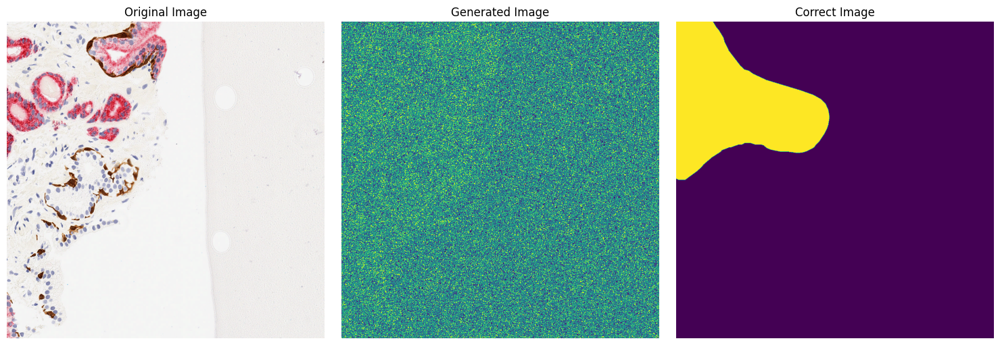


Batches:  50%|█████     | 112/224 [00:33<00:19,  5.89it/s]


Val loader length: 30


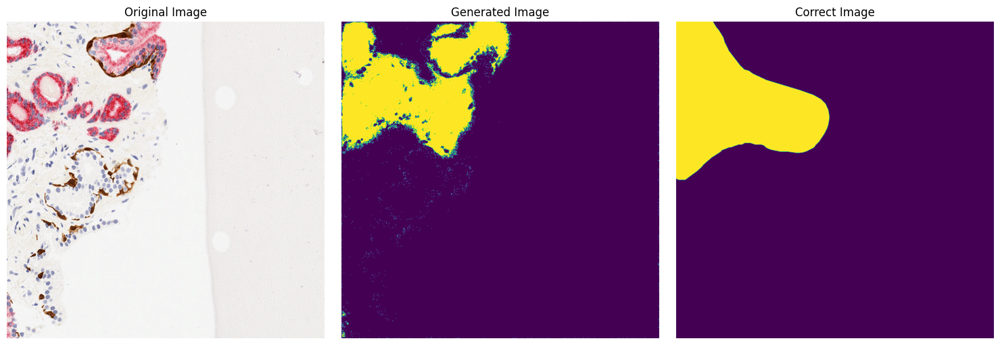


Batches:   0%|          | 0/224 [00:00<?, ?it/s]


Val loader length: 30


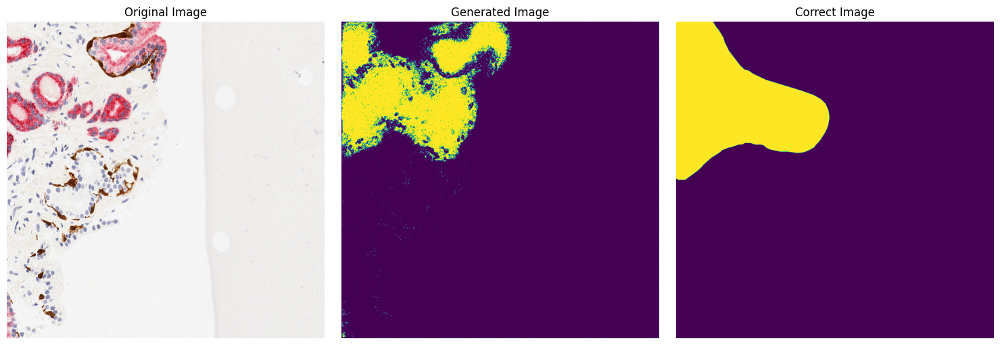


Batches:  50%|█████     | 112/224 [00:24<00:18,  5.90it/s]


Val loader length: 30


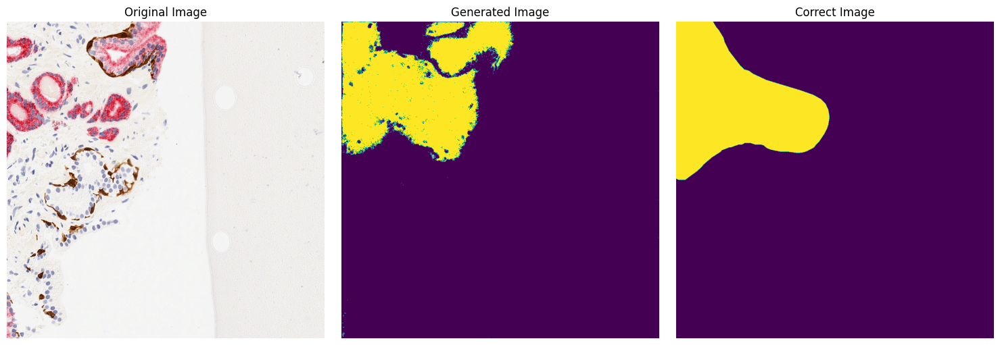


Batches:   0%|          | 0/224 [00:00<?, ?it/s]


Val loader length: 30


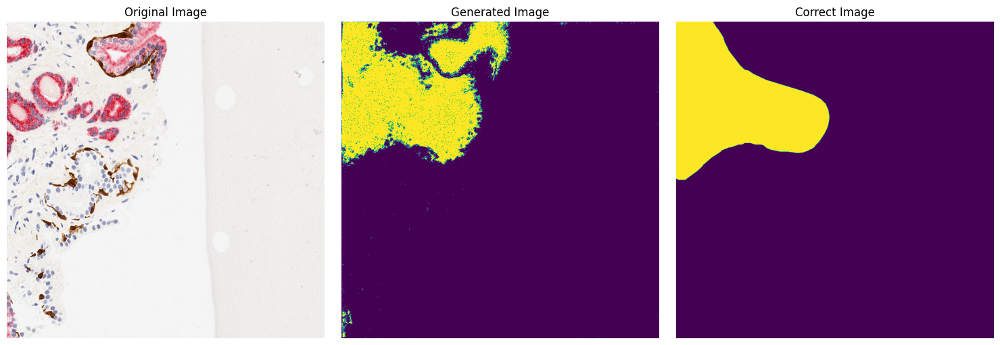


Batches:  50%|█████     | 112/224 [00:24<00:18,  5.91it/s]


Val loader length: 30


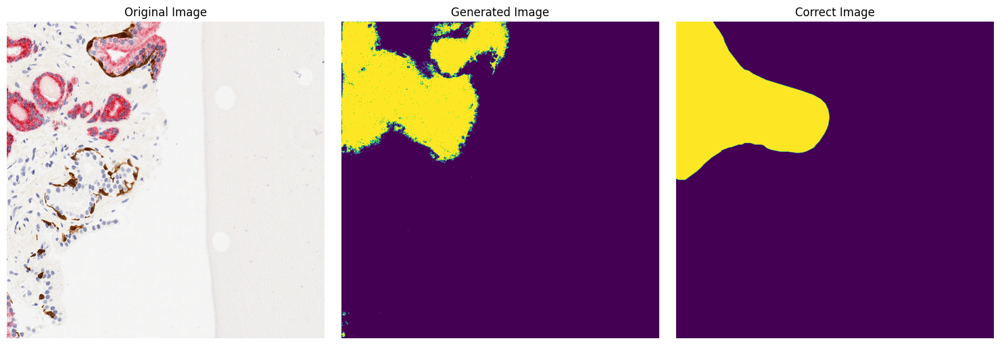


Batches:   0%|          | 0/224 [00:00<?, ?it/s]


Val loader length: 30


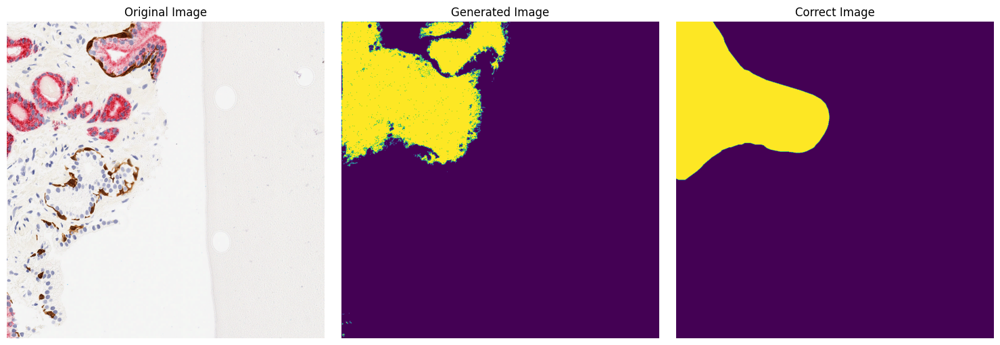


Batches:  50%|█████     | 112/224 [00:24<00:19,  5.89it/s]


Val loader length: 30


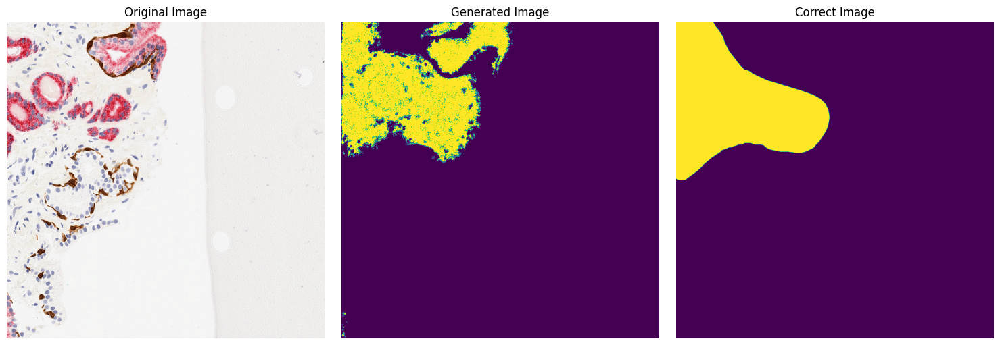


Batches:   0%|          | 0/224 [00:00<?, ?it/s]


Val loader length: 30


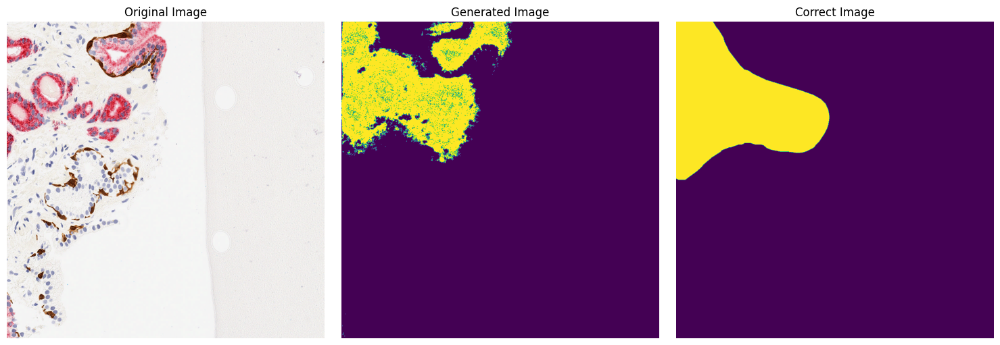


Batches:  50%|█████     | 112/224 [00:24<00:18,  5.90it/s]


Val loader length: 30


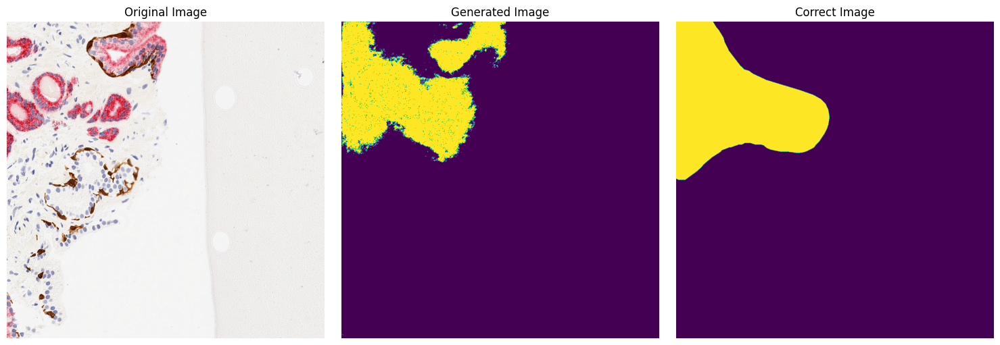


Batches:   0%|          | 0/224 [00:00<?, ?it/s]


Val loader length: 30


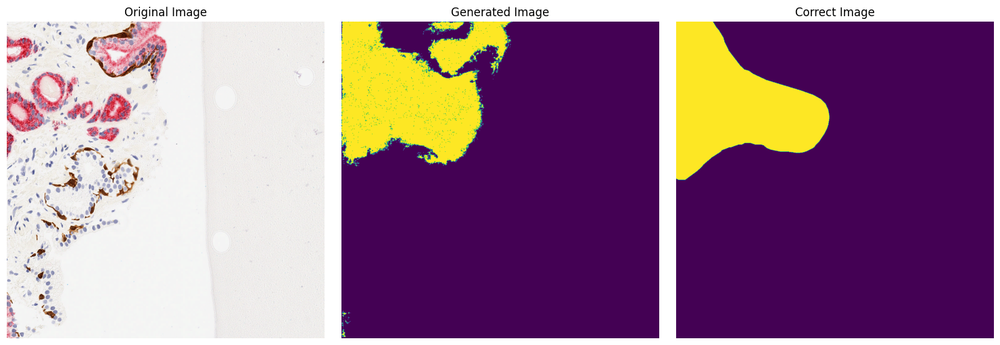


Batches:  50%|█████     | 112/224 [00:24<00:19,  5.88it/s]


Val loader length: 30


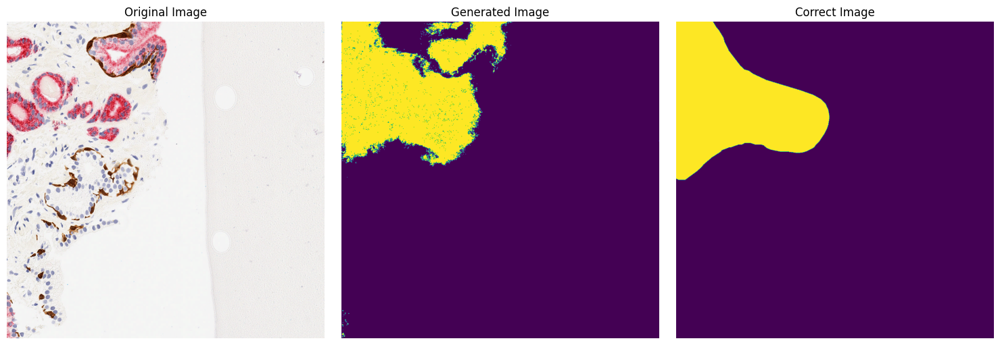


Batches:   0%|          | 0/224 [00:00<?, ?it/s]


Val loader length: 30


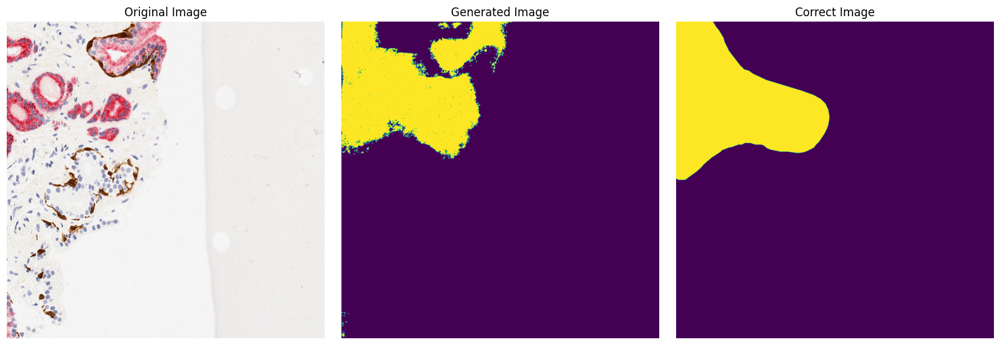


Batches:  50%|█████     | 112/224 [00:24<00:19,  5.88it/s]


Val loader length: 30


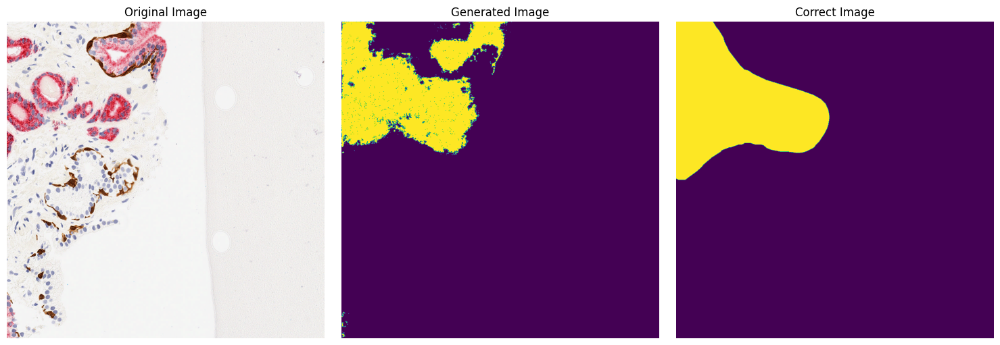


Batches:   0%|          | 0/224 [00:00<?, ?it/s]


Val loader length: 30


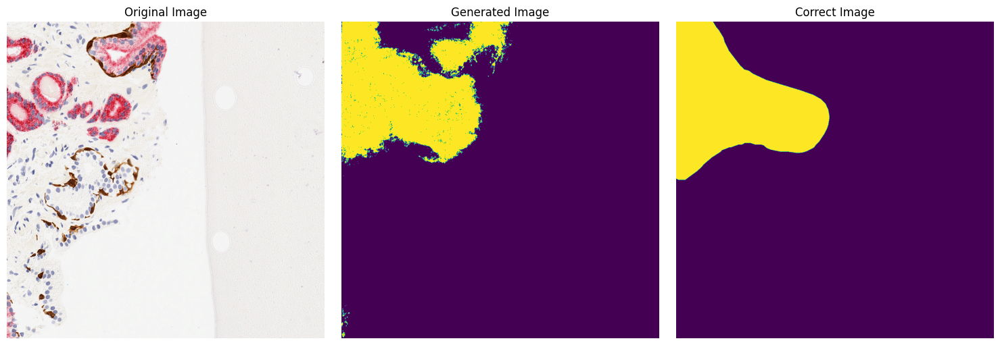


Batches:  50%|█████     | 112/224 [00:24<00:18,  5.90it/s]


Val loader length: 30


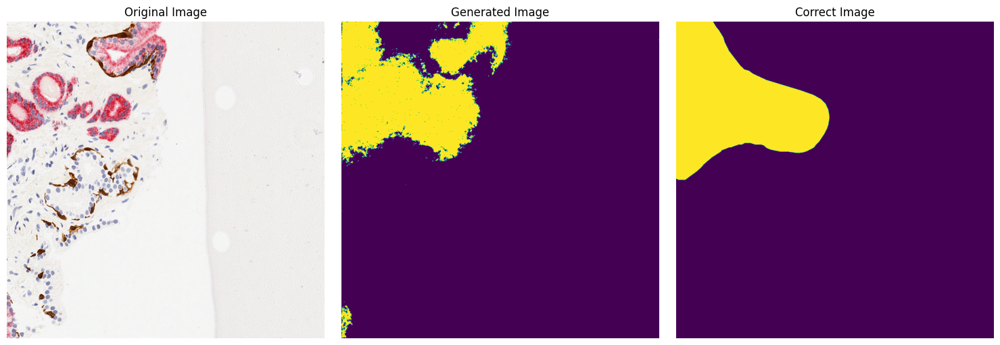


Batches:   0%|          | 0/224 [00:00<?, ?it/s]


Val loader length: 30


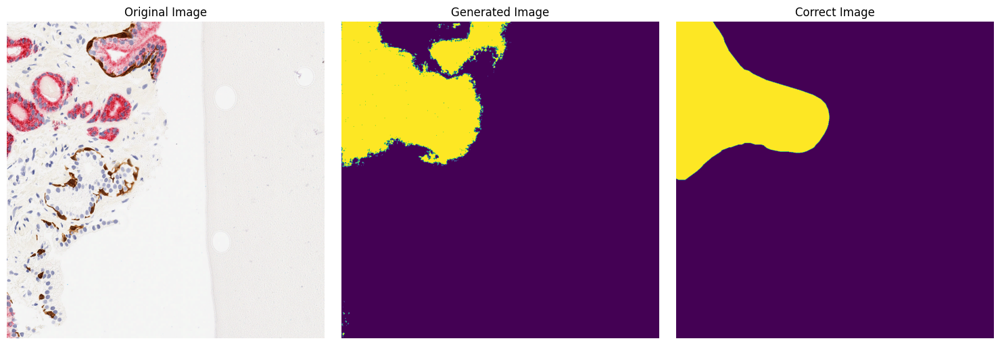


Batches:  50%|█████     | 112/224 [00:24<00:18,  5.91it/s]


Val loader length: 30


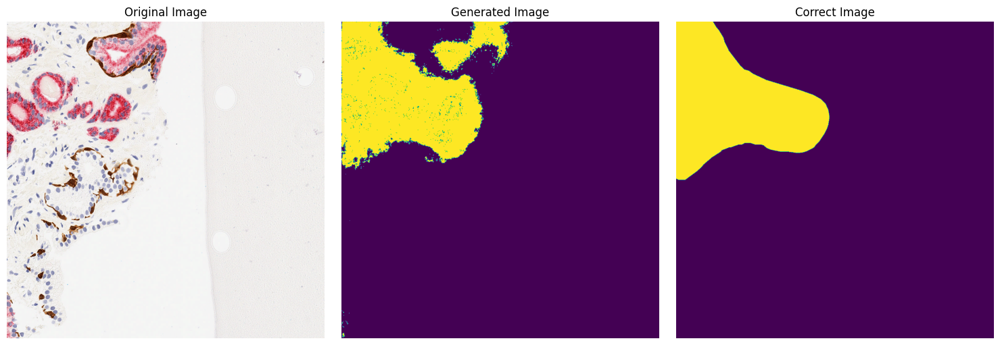


Batches:   0%|          | 0/224 [00:00<?, ?it/s]


Val loader length: 30


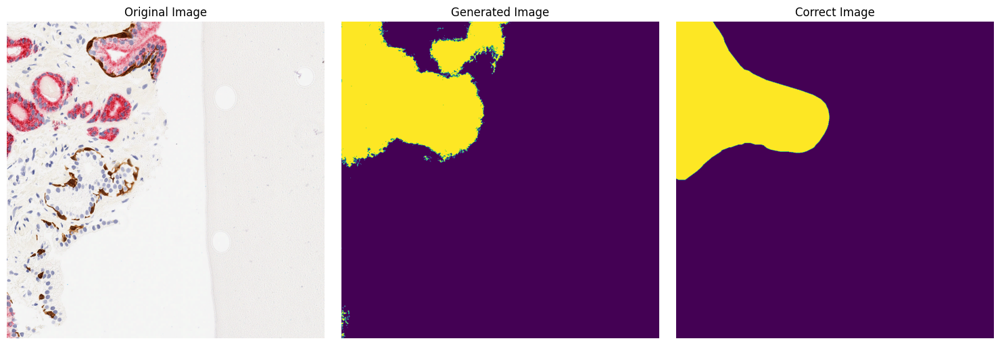


Batches:  50%|█████     | 112/224 [00:24<00:18,  5.90it/s]


Val loader length: 30


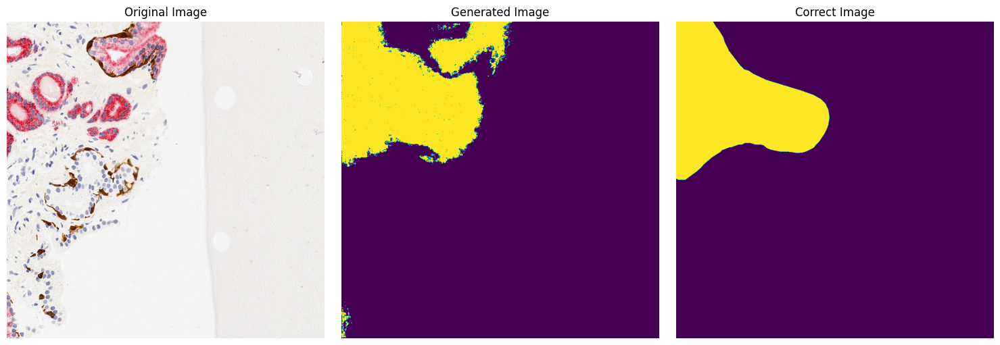


Epochs: 100%|██████████| 10/10 [08:03<00:00, 48.38s/it]


In [12]:
import traceback

def train_wrapper():
  try:
    gc.collect()
    print(f'GPU memory allocated: {torch.cuda.memory_allocated() / 1e9}')
    return train()
  except Exception as e:
    print("An error occurred:", str(e))
    print(traceback.format_exc())

data = train_wrapper()

In [13]:
def show_graph(data):
  training_losses, validation_losses, train_accuracies, validation_accuracies, timestamps = data

  # Big plot
  plt.figure(figsize=(10, 5))
  plt.suptitle('Training Metrics', fontsize=16, y=1.08)

  # Losses
  plt.subplot(1, 2, 1)
  plt.plot(timestamps, training_losses, label='train')
  plt.plot(timestamps, validation_losses, label='validation')
  plt.xlabel('Seconds')
  plt.ylabel('Loss')
  # plt.title('Loss over Batches')
  plt.legend()

  # Accuracies
  plt.subplot(1, 2, 2)
  plt.plot(timestamps, train_accuracies, label='train')
  plt.plot(timestamps, validation_accuracies, label="validation")
  plt.xlabel('Seconds')
  plt.ylabel('Accuracy')
  # plt.title('Accuracy over Batches')
  plt.legend()

  plt.tight_layout()
  plt.show()

  print(f'Max Validation Accuracy: {max(validation_accuracies)}')
  print(f'Model size: {model.num_params()/1000000:.2f} Million')
  print('\n\n')

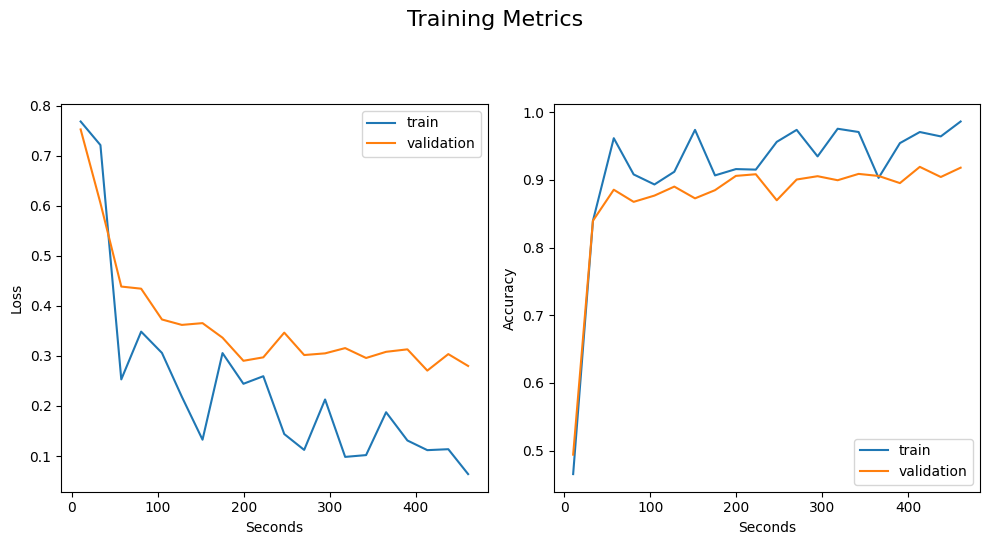

Max Validation Accuracy: 0.9193155924479167
Model size: 31.04 Million





In [14]:
# Your plotting code here
show_graph(data)